In [6]:
import pandas as pd
import geopandas as gpd

import contextily as ctx
import shapely

from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter

from time import sleep # to limit geocoding rate in for loops

import matplotlib.pyplot as plt
from matplotlib.colors import to_hex
import seaborn as sns
import folium
import flask
from flask import Flask,render_template

%matplotlib inline

In [133]:
import base64
from folium import IFrame
import io
import base64
from PIL import Image

app = Flask(__name__)

@app.route('/')
def render_map():

    #Add Marker
    encoded = base64.b64encode(open('C:\\Users\\denny\Documents\\Projects\\Ireland_Trip\\photos\\IMG_2057.JPEG', 'rb').read())


    buffer = io.BytesIO()
    imgdata = base64.b64decode(encoded)
    img = Image.open(io.BytesIO(imgdata))
    new_img = img.resize((320, 240))  # x, y
    new_img.save(buffer, format="PNG")
    img_b64 = base64.b64encode(buffer.getvalue())


    html = '<img src="data:image/png;base64,{}">'.format
    iframe = IFrame(html(img_b64.decode('UTF-8')), width=200, height=200)
    popup = folium.Popup(iframe, max_width=400)

    folium.Marker(location=[53.3429054,-6.2714076], tooltip=html, popup = popup, 
    icon=folium.Icon(color = 'gray')).add_to(m)    

    return m._repr_html_()	
	
if __name__ == '__main__':
    app.run(debug = True)   

 * Serving Flask app '__main__' (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: on


 * Restarting with stat


SystemExit: 1

C:\Users\denny\.conda\envs\ireland_trip\lib\site-packages\IPython\core\interactiveshell.py:3465: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [165]:
trip_locations = pd.read_csv("locations.tsv", delimiter='\t')

In [166]:
# Set up geolocator object
# Increase the timeout so I don't get timeout errors as much
geolocator = Nominatim(user_agent="road-trip-map", timeout=10)
# Make sure to limit requests to abide by terms
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1)


location = geolocator.geocode("Christchurch Pl, Wood Quay, Dublin 8, Ireland")
print(location.address)
print((location.latitude, location.longitude))


# Get the unique cities in my dataframe
# cities = df[['city', 'state']].drop_duplicates()
# # Convert the two columns city and state into one string
# cities['to_geolocate'] = cities['city'] + ' ' + cities['state']

# # Geolocate the cities - this takes a couple of minutes
# cities['location'] = cities['to_geolocate'].apply(geocode)

Christchurch Place, Wood Quay A ED, Dublin, Dublin 8, Leinster, D08 RF3F, Éire / Ireland
(53.3429054, -6.2714076)


In [167]:
trip_locations['geoloc'] = trip_locations.apply(lambda row: geolocator.geocode(row['Location']), axis=1)

In [169]:
trip_locations['lat'] = trip_locations.apply(lambda row: row['geoloc'].latitude, axis=1)
trip_locations['lon'] = trip_locations.apply(lambda row: row['geoloc'].longitude, axis=1)

In [170]:
trip_locations.to_csv("locations1.csv")

In [171]:
locations1 = pd.read_csv("locations1.csv")

In [175]:
pd.read_csv("locations1.csv").keys()

Index(['Unnamed: 0', 'Location', 'geoloc', 'lat', 'lon', ' description'], dtype='object')

In [172]:
import os

for i in locations1['Location']:
    print(i)
    if not os.path.exists('image_locations/' + i):
        os.makedirs('image_locations/' + i)

Christchurch Pl, Wood Quay, Dublin 8, Ireland
Trinity College Dublin, Dublin, Ireland
Kilmainham Gaol, Dublin, Ireland
Guinness Storehouse, Dublin, Ireland
Wicklow Mountains
Grafton Street, Dublin, Ireland
Kilkenny, Ireland
Waterford, Ireland
Tramore, Ireland
Bunmahon, Ireland
Dungarvan, Ireland
R676, Kilclooney, Co. Waterford, Ireland
Rock of Cashel
Dromagh, Co. Cork, Ireland
Cobh, Ireland
Cork, Ireland
Blarney Castle
Kenmare, Kerry, Ireland
Kenmare Bay, Kerry, Ireland
Waterville, Ireland
Portmagee, Kerry, Ireland
Valentia Island, Kerry, Ireland
Ballycarbery East, Co. Kerry, Ireland
Killorglin, Kerry, Ireland
Inch Beach, Kerry, Ireland
Dingle Town, Kerry, Ireland
Dunmore head, Kerry, Ireland
Gap of Dunloe, Kerry, Ireland
Killarney Town, Kerry, Ireland
Ladies View, Kerry, Ireland
Muckross House, Kerry, Ireland
Torc Waterfall, Kerry, Ireland
Limerick, Limerick, Ireland
Cliffs of Moher, Ireland
Galway, Galway, Ireland
R335, Clashcame, Co. Mayo, Ireland
Westport, Ireland
Sligo, Ireland
Do

In [61]:
# Add the shapely Point in the 'geometry' column
trip_locations['geometry'] = gpd.points_from_xy(trip_locations['lon'], trip_locations['lat'])

# And convert the dataframe to a geopandas dataframe
gdf = gpd.GeoDataFrame(trip_locations)

C:\Users\denny\.conda\envs\ireland_trip\lib\site-packages\geopandas\array.py:275: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return GeometryArray(vectorized.points_from_xy(x, y, z), crs=crs)


In [70]:
gdf

,Location,geoloc,lat,lon,geometry
0,"Christchurch Pl, Wood Quay, Dublin 8, Ireland","(Christchurch Place, Wood Quay A ED, Dublin, D...",53.342905,-6.271408,POINT (-6.27141 53.34291)
1,Wicklow Mountains,"(Wicklow Mountains National Park, County Wickl...",53.104032,-6.459963,POINT (-6.45996 53.10403)
2,"Grafton Street, Dublin, Ireland","(Grafton Street, Royal Exchange B ED, Dublin, ...",53.342711,-6.259578,POINT (-6.25958 53.34271)
3,"Kilkenny, Ireland","(Kilkenny, The Municipal District of Kilkenny ...",52.651022,-7.248495,POINT (-7.24849 52.65102)
4,"Waterford, Ireland","(Waterford, County Waterford, Munster, Éire / ...",52.261000,-7.111908,POINT (-7.11191 52.26100)
5,"Tramore, Ireland","(Tramore, Waterford City Metropolitan District...",52.183597,-7.149620,POINT (-7.14962 52.18360)
6,"Bunmahon, Ireland","(Bunmahon, The Municipal District of Comeragh,...",52.139862,-7.370852,POINT (-7.37085 52.13986)
7,"Dungarvan, Ireland","(Dungarvan, The Municipal District of Dungarva...",52.089749,-7.621031,POINT (-7.62103 52.08975)
8,"R676, Kilclooney, Co. Waterford, Ireland","(Kilclooney, Ballydurn, The Municipal District...",52.243171,-7.515823,POINT (-7.51582 52.24317)
9,Rock of Cashel,"(Rock of Cashel, Tipperary Heritage Way, Cashe...",52.520198,-7.890575,POINT (-7.89058 52.52020)


In [68]:
# Read in the world - this returns just a normal geodataframe
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Get just Ireland
ireland = world.query('name == "Ireland"')

In [69]:
ireland

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
133,5011102,Europe,Ireland,IRL,322000.0,"POLYGON ((-6.19788 53.86757, -6.03299 53.15316..."


In [ ]:
# # I manually checked that this returns the Hot Springs in Arkansas
# oakland = geocode('oakland ca usa')
# for ix in [93, 94]:
#     gdf.at[ix, 'location'] = oakland # need to use at to avoide error bc "hotsprings" is a tuple
#     gdf.loc[ix, 'latitude'] = oakland.latitude
#     gdf.loc[ix, 'longitude'] = oakland.longitude
#     # Re-code the lat/lon into a point
#     gdf.loc[ix, 'geometry'] = shapely.geometry.Point(gdf.loc[ix, 'longitude'], gdf.loc[ix, 'latitude'])

In [71]:
def update_loc(ix, newloc):
    gdf.at[ix, 'geoloc'] = newloc
    gdf.loc[ix, 'latitude'] = newloc.latitude
    gdf.loc[ix, 'longitude'] = newloc.longitude
    # Re-code the lat/lon into a point
    gdf.loc[ix, 'geometry'] = shapely.geometry.Point(gdf.loc[ix, 'longitude'], gdf.loc[ix, 'latitude'])

# # My original Joplin campground coded somewhere in West Virginia
# ix = 0
# newloc = geocode('joplin campground')
# update_loc(ix, newloc)

# # Wyoming ('wy') got read in as "way", so these two are in the wrong place
# ix = 73
# newloc = geocode('sundance wyoming')
# update_loc(ix, newloc)

# ix = 76
# newloc = geocode('cody wyoming')
# update_loc(ix, newloc)

C:\Users\denny\.conda\envs\ireland_trip\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


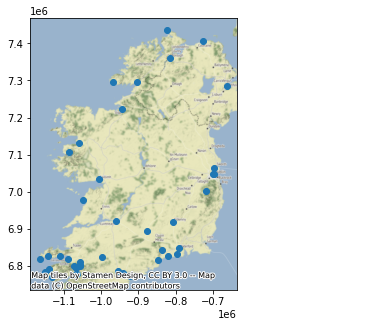

In [72]:
# Set the projection to WGS84
gdf.crs = {'init': 'epsg:4326'}
# Modify projection to match what contextily uses
gdf = gdf.to_crs(epsg=3857)

# Plot the points
ax = gdf.plot(figsize=(10, 5))

# Add basemap
ctx.add_basemap(ax=ax)

In [74]:
# Get line of first part of trip
part1 = shapely.geometry.LineString(
    gdf['geometry'].values
)

# part2 = shapely.geometry.LineString(
#     gdf.query('part == 2').sort_values(by=['day', 'time'])['geometry'].values
# )


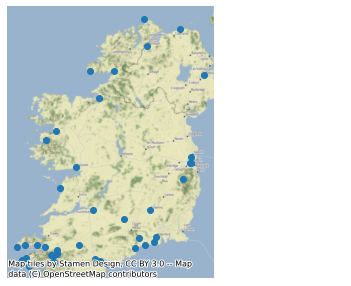

In [73]:
# Re-plot everything, adding on the state outlines
fig, ax = plt.subplots(figsize=(10, 5))

# Plot the outlines
# states.boundary.plot(color='black', linewidth=0.5, ax=ax)

# Plot the points
gdf.plot(ax=ax)

# Add basemap
ctx.add_basemap(ax=ax)

# Remove axes
ax.set_axis_off()

C:\Users\denny\.conda\envs\ireland_trip\lib\site-packages\geopandas\plotting.py:678: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


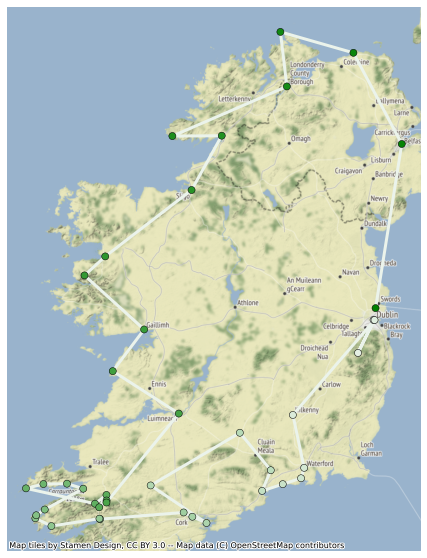

In [75]:
linegdf = gpd.GeoDataFrame(
    {'geometry': [part1],
     'trip_part': ['part1']}
)

# Make the plot
fig, ax = plt.subplots(figsize=(15, 10))

# Plot the state outlines
# states.boundary.plot(color='black', linewidth=0.5, ax=ax)

## Plot Part 1 of the trip

# I'm getting an error when I pass in the tuple, not sure why
c = to_hex(sns.light_palette('green')[0])

# Plot line
linegdf.plot(
    color=c,
    linewidth=3,
    ax=ax
)

# Plot points colored by day
gdf.plot(
    # column='day_number',
    cmap=sns.light_palette('green', as_cmap=True),
    ax=ax,
    markersize=50,
    edgecolor='black', linewidth=0.5,
    zorder=1000 # force the points to be the top layer of the plot
)

## Part 2
c = to_hex(sns.light_palette('purple')[0])

# Plot line
linegdf.query('trip_part == "part2"').plot(
    color=c,
    linewidth=3,
    ax=ax
)

# Add basemap
ctx.add_basemap(ax=ax)

# Remove axes
ax.set_axis_off()

In [86]:
m = folium.Map(location=[53.3429054,-6.2714076], zoom_start=7.4)


In [88]:
import json

In [130]:
import base64
from folium import IFrame
import io
import base64
from PIL import Image

#Add Marker
encoded = base64.b64encode(open('C:\\Users\\denny\Documents\\Projects\\Ireland_Trip\\photos\\IMG_2057.JPEG', 'rb').read())


buffer = io.BytesIO()
imgdata = base64.b64decode(encoded)
img = Image.open(io.BytesIO(imgdata))
new_img = img.resize((320, 240))  # x, y
new_img.save(buffer, format="PNG")
img_b64 = base64.b64encode(buffer.getvalue())


html = '<img src="data:image/png;base64,{}">'.format
iframe = IFrame(html(img_b64.decode('UTF-8')), width=200, height=200)
popup = folium.Popup(iframe, max_width=400)

folium.Marker(location=[53.3429054,-6.2714076], tooltip=html, popup = popup, 
icon=folium.Icon(color = 'gray')).add_to(m)

In [131]:
# folium.Marker(location=[53.3429054,-6.2714076],
#     popup=folium.Popup(max_width=450).add_child('C:\\Users\\denny\\Documents\\Projects\\Ireland_Trip\\photos\\IMG_2057.JPEG'))

In [159]:
points = []
for i in range(len(trip_locations)):
    points.append([trip_locations.iloc[i]['lat'], trip_locations.iloc[i]['lon']])

In [160]:
points

[[53.3429054, -6.2714076],
 [53.10403205, -6.4599634716120615],
 [53.3427111, -6.2595779],
 [52.6510216, -7.2484948],
 [52.2609997, -7.1119081],
 [52.1835974, -7.1496198989537],
 [52.1398615, -7.3708525],
 [52.0897488, -7.6210306],
 [52.24317105, -7.515822732445772],
 [52.5201977, -7.890575165703573],
 [52.1302644, -8.970309157766149],
 [51.8500947, -8.294279],
 [51.897077, -8.4654674],
 [51.92906105, -8.570844312491802],
 [51.8790432, -9.5826375],
 [51.882856, -9.5906215],
 [51.8271274, -10.1718452],
 [51.8857163, -10.3660444],
 [51.90805095, -10.355774475157709],
 [51.950792500000006, -10.252603043557173],
 [52.1061973, -9.7867881],
 [52.143335, -9.9834329],
 [52.1408381, -10.2688831],
 [52.1086466, -10.4796422],
 [51.9943895, -9.6442886],
 [52.0595746, -9.505322],
 [51.9674501, -9.5928918],
 [52.018241599999996, -9.503968174504672],
 [52.0032196, -9.5056129],
 [52.661252, -8.6301239],
 [52.9717877, -9.4291244],
 [53.2744122, -9.0490601],
 [53.6639454, -9.7711786],
 [53.8000645, -9.5

In [153]:
for i in trip_locations.T:
    print(i)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41


In [134]:
trip_locations = pd.read_csv("locations.tsv", delimiter='\t')
# Set up geolocator object
# Increase the timeout so I don't get timeout errors as much
geolocator = Nominatim(user_agent="road-trip-map", timeout=10)
# Make sure to limit requests to abide by terms
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1)
trip_locations['geoloc'] = trip_locations.apply(lambda row: geolocator.geocode(row['Location']), axis=1)
trip_locations['lat'] = trip_locations.apply(lambda row: row['geoloc'].latitude, axis=1)
trip_locations['lon'] = trip_locations.apply(lambda row: row['geoloc'].longitude, axis=1)
# Add the shapely Point in the 'geometry' column
trip_locations['geometry'] = gpd.points_from_xy(trip_locations['lon'], trip_locations['lat'])


ls = folium.PolyLine([[row['lat'], row['lon']] for row in trip_locations], color='red')
ls.add_children(folium.Popup("outline Popup on Polyline"))
ls.add_to(m)

C:\Users\denny\.conda\envs\ireland_trip\lib\site-packages\geopandas\array.py:275: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return GeometryArray(vectorized.points_from_xy(x, y, z), crs=crs)


TypeError: string indices must be integers

In [132]:
m